- In this example, we have a training set of 322 2048 pixel x 2048 pixel crops from orthomosaic landscape images created from [eBee](https://www.sensefly.com/drone/ebee-x-fixed-wing-drone/) drone flights in the same park as the observation used in this worked example. We have a validation set of 190 same sized crops from other parts of the same orthomosiacs.
            - These crops where annotated by hand by drawing zero width lines over game trails. 
            - There was a lot of room for interpretation in deciding what a game trail is and isn't and was a fatiging task so the annotatoins are noisy
            - Annotation masks were created by used a fixed annotation line width of 18 pixels for all annotations
            - We also tried training a model with an additional buffer class that didn't contribute to the loss

In [1]:
import copy
import glob
import json
import logging
import os
import random

import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch, torchvision

import detectron2
from detectron2 import model_zoo

from detectron2.checkpoint import DetectionCheckpointer
from detectron2.config import get_cfg
from detectron2.data import detection_utils as utils
from detectron2.data import DatasetMapper, build_detection_train_loader, build_detection_test_loader
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets.coco import load_sem_seg
import detectron2.data.transforms as T
from detectron2.engine import DefaultPredictor
from detectron2.engine import DefaultTrainer, default_argument_parser, default_setup, launch
from detectron2.evaluation import COCOEvaluator, DatasetEvaluators
from detectron2.evaluation import CityscapesSemSegEvaluator, DatasetEvaluators, SemSegEvaluator
from detectron2.layers import ASPP, Conv2d, ShapeSpec, get_norm
from detectron2.modeling import SEM_SEG_HEADS_REGISTRY
from detectron2.projects.deeplab import add_deeplab_config, build_lr_scheduler
import detectron2.utils.comm as comm
from detectron2.utils.logger import setup_logger
from detectron2.utils.visualizer import Visualizer

import fvcore.nn.weight_init as weight_init

from torch import nn
import torch.distributed as dist
from torch.nn import functional as F


# local .json file with local path info
ungulates_root = os.path.dirname(os.path.dirname(os.getcwd()))
local_paths_file = os.path.join(ungulates_root, 'local-paths.json')
with open(local_paths_file, "r") as json_file:
    local_paths = json.load(json_file)

import sys
sys.path.append(
    os.path.join(local_paths['overhead_functions_path'], "detectron2_classes")
)

from LossEvalHook import LossEvalHook

In [2]:
name = 'buffer'

In [5]:
train_masks_root = os.path.join(local_paths['gametrail_folder'], 
                                "data", "train", "masks")
val_masks_root = os.path.join(local_paths['gametrail_folder'], 
                                "data", "val", "masks")
image_root = os.path.join(local_paths['gametrail_folder'], 
                                "data", "all_data", "images")

DatasetCatalog.register("train", lambda: load_sem_seg(train_masks_root, image_root))
DatasetCatalog.register("val", lambda: load_sem_seg(val_masks_root, image_root))

In [6]:
masks = glob.glob(os.path.join(train_masks_root, '*'))

In [14]:
train_metadata = MetadataCatalog.get("train").set(
    sem_seg_root=train_masks_root, image_root=image_root, evaluator_type="sem_seg",
    stuff_classes=['background', 'path', 'buffer'], stuff_colors=[(0,255,0), (255, 0, 0), (255, 255, 255)]
)
MetadataCatalog.get("val").set(
    sem_seg_root=val_masks_root, image_root=image_root, evaluator_type="sem_seg",
    stuff_classes=['background', 'path', 'buffer'], stuff_colors=[(0,255,0), (255, 0, 0), (255, 255, 255)]
)

In [9]:
train_dicts = DatasetCatalog.get("train")
val_dicts = DatasetCatalog.get("val")
print("There are {} train files and {} val files".format(len(train_dicts), len(val_dicts)))

Directory /home/golden/kenya_drones/3D_mapping/auto_detection/data/all_data/images and /home/golden/kenya_drones/3D_mapping/auto_detection/data/train/masks has 326 and 322 files, respectively.
Will use their intersection of 322 files.
Directory /home/golden/kenya_drones/3D_mapping/auto_detection/data/all_data/images and /home/golden/kenya_drones/3D_mapping/auto_detection/data/val/masks has 326 and 190 files, respectively.
Will use their intersection of 190 files.


There are 322 train files and 190 val files


(2048, 2048, 3)


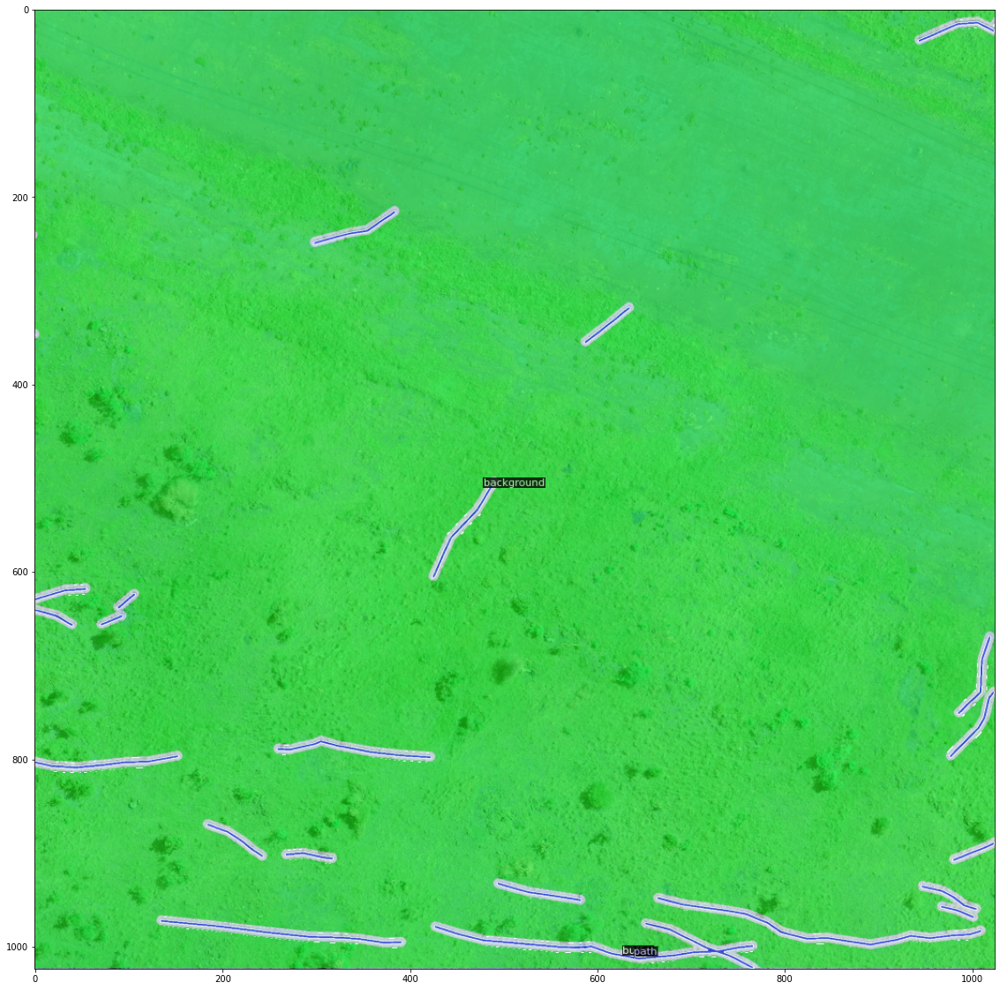

In [10]:

for d in train_dicts[:1]:
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    
    vis = visualizer.draw_dataset_dict(d)

    plt.figure(figsize=(20,20))
    plt.imshow(vis.get_image()[:, :, ::-1])
    print(img.shape)


In [11]:
def setup(config_file):
    """
    Create configs and perform basic setups.
    """
    cfg = get_cfg()
    add_deeplab_config(cfg)
    cfg.merge_from_file(config_file)
    cfg.DATASETS.TRAIN = ("train",)
    cfg.DATASETS.TEST = ("val",)
    cfg.DATALOADER.NUM_WORKERS = 6
    cfg.DATALOADER.ASPECT_RATIO_GROUPING = False

    cfg.SOLVER.IMS_PER_BATCH = 8
    cfg.SOLVER.BASE_LR = 0.00275 #.00125
    cfg.SOLVER.MAX_ITER = (32000)
    cfg.SOLVER.WARMUP_ITERS = 100
    cfg.SOLVER.REFERENCE_WORLD_SIZE = 1
    cfg.MODEL.SEM_SEG_HEAD.LOSS_TYPE = "cross_entropy"
    cfg.MODEL.SEM_SEG_HEAD.NUM_CLASSES = 3
    cfg.MODEL.SEM_SEG_HEAD.IGNORE_VALUE = 2
    # Download weights before using: https://github.com/facebookresearch/detectron2/tree/main/projects/DeepLab
    cfg.MODEL.WEIGHTS = ".../model_final_deeplabv3plus_cityscapes_id28054032.pkl"

    cfg.TEST.EVAL_PERIOD = 500
    cfg.TEST.DETECTIONS_PER_IMAGE = 200

    train_shape = cv2.imread(train_dicts[0]["file_name"]).shape
    val_shape = cv2.imread(train_dicts[0]["file_name"]).shape

    cfg.INPUT.MIN_SIZE_TRAIN = (0)
    cfg.INPUT.MIN_SIZE_TEST = (0)
    cfg.INPUT.MAX_SIZE_TRAIN = (int(np.max(train_shape)))
    cfg.INPUT.MAX_SIZE_TEST = (int(np.max(val_shape)))

    cfg.INPUT.CROP.ENABLED = True
    cfg.INPUT.CROP.TYPE = "absolute"
    cfg.INPUT.CROP.SIZE = (512, 512)
    cfg.INPUT.VER_FLIP = True
    cfg.INPUT.HOR_FLIP = True
    cfg.INPUT.CONTRAST = True
    cfg.INPUT.CONTRAST_RANGE = (.5, 1.5)
    cfg.INPUT.BRIGHTNESS = True
    cfg.INPUT.BRIGHTNESS_RANGE = (.3, 1.4)



    cfg.OUTPUT_DIR = os.path.join(cfg.OUTPUT_DIR, '{}_maxiter-{}_lr-{}_detectPerIm-{}_minsize-{}_batchsize-{}'.format(
        name, cfg.SOLVER.MAX_ITER, cfg.SOLVER.BASE_LR, cfg.TEST.DETECTIONS_PER_IMAGE, 
        np.min(cfg.INPUT.MIN_SIZE_TRAIN), cfg.SOLVER.IMS_PER_BATCH))
    cfg.freeze()
    default_setup(cfg, [])
    return cfg

In [13]:
config_file = "deeplab_v3_plus_R_103_os16_mg124_poly_90k_bs16.yaml"
cfg = setup(config_file)

In [15]:
class MyDatasetMapper(DatasetMapper):
    
    def __init__(self, cfg, is_train=True):
        if cfg.INPUT.CROP.ENABLED and is_train:
            self.crop_gen = T.RandomCrop(cfg.INPUT.CROP.TYPE, cfg.INPUT.CROP.SIZE)
            logging.getLogger(__name__).info("CropGen used in training: " + str(self.crop_gen))
        else:
            self.crop_gen = None

        self.tfm_gens = utils.build_transform_gen(cfg, is_train)
        
        if cfg.INPUT.VER_FLIP:
            self.tfm_gens.append(T.RandomFlip(vertical=True, horizontal=False))
        if cfg.INPUT.HOR_FLIP:
            self.tfm_gens.append(T.RandomFlip(vertical=False, horizontal=True))
        if cfg.INPUT.CONTRAST:
            self.tfm_gens.append(T.RandomContrast(*cfg.INPUT.CONTRAST_RANGE))
        if cfg.INPUT.BRIGHTNESS:
            self.tfm_gens.append(T.RandomBrightness(*cfg.INPUT.BRIGHTNESS_RANGE))
            
        logger = logging.getLogger(__name__)
        logger.info("TransformGens used in training: " + str(self.tfm_gens))

        # fmt: off
        self.img_format     = cfg.INPUT.FORMAT
        self.mask_on        = cfg.MODEL.MASK_ON
        self.mask_format    = cfg.INPUT.MASK_FORMAT
        self.keypoint_on    = cfg.MODEL.KEYPOINT_ON
        self.load_proposals = cfg.MODEL.LOAD_PROPOSALS
        # fmt: on
        
        self.keypoint_hflip_indices = None

        self.is_train = is_train
    
    def __call__(self, dataset_dict):
        """
        Args:
            dataset_dict (dict): Metadata of one image, in Detectron2 Dataset format.
        Returns:
            dict: a format that builtin models in detectron2 accept
        """
        dataset_dict = copy.deepcopy(dataset_dict)  # it will be modified by code below
        # USER: Write your own image loading if it's not from a file
        image = utils.read_image(dataset_dict["file_name"], format=self.img_format)
        
        print(f'image shape {image.shape}')
        utils.check_image_size(dataset_dict, image)
        
        if "sem_seg_file_name" in dataset_dict:
            sem_seg_gt = utils.read_image(dataset_dict.pop("sem_seg_file_name"), "L").squeeze(2)
        else:
            sem_seg_gt = None
            
        aug_input = T.StandardAugInput(image, sem_seg=sem_seg_gt)
        augmentations = ([self.crop_gen] if self.crop_gen else []) + self.tfm_gens
        transforms = aug_input.apply_augmentations(augmentations)
        image, sem_seg_gt = aug_input.image, aug_input.sem_seg

        image_shape = image.shape[:2]  # h, w

        # Pytorch's dataloader is efficient on torch.Tensor due to shared-memory,
        # but not efficient on large generic data structures due to the use of pickle & mp.Queue.
        # Therefore it's important to use torch.Tensor.
        dataset_dict["image"] = torch.as_tensor(
            np.ascontiguousarray(image.transpose(2, 0, 1)))
        if sem_seg_gt is not None:
            dataset_dict["sem_seg"] = torch.as_tensor(sem_seg_gt.astype("long"))

        if not self.is_train:
            dataset_dict.pop("annotations", None)
            dataset_dict.pop("sem_seg_file_name", None)
            return dataset_dict

        return dataset_dict
    

class Trainer(DefaultTrainer):
    """
    We use the "DefaultTrainer" which contains a number pre-defined logic for
    standard training workflow. They may not work for you, especially if you
    are working on a new research project. In that case you can use the cleaner
    "SimpleTrainer", or write your own training loop.
    """

    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        """
        Create evaluator(s) for a given dataset.
        This uses the special metadata "evaluator_type" associated with each builtin dataset.
        For your own dataset, you can simply create an evaluator manually in your
        script and do not have to worry about the hacky if-else logic here.
        """
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        evaluator_type = MetadataCatalog.get(dataset_name).evaluator_type
        if evaluator_type == "sem_seg":
            return SemSegEvaluator(
                dataset_name,
                distributed=False,
                num_classes=cfg.MODEL.SEM_SEG_HEAD.NUM_CLASSES,
                ignore_label=cfg.MODEL.SEM_SEG_HEAD.IGNORE_VALUE,
                output_dir=output_folder,
            )
        else:
            print("evaluator type should be \"sem_seg\".")
            
                     
    def build_hooks(self):
        hooks = super().build_hooks()
        hooks.insert(-1, LossEvalHook(
            cfg.TEST.EVAL_PERIOD,
            self.model,
            build_detection_test_loader(
                self.cfg,
                self.cfg.DATASETS.TEST[0],
                DatasetMapper(self.cfg,True)
            )
        ))
        return hooks

    @classmethod
    def build_train_loader(cls, cfg):
        """
        Returns:
            iterable
        It now calls :func:`detectron2.data.build_detection_train_loader` but now with mapper.
        Overwrite it if you'd like a different data loader.
        """
        
        mapper = MyDatasetMapper(cfg)
        return build_detection_train_loader(cfg, mapper=mapper)

    @classmethod
    def build_lr_scheduler(cls, cfg, optimizer):
        """
        It now calls :func:`detectron2.solver.build_lr_scheduler`.
        Overwrite it if you'd like a different scheduler.
        """
        return build_lr_scheduler(cfg, optimizer)

In [16]:
mapper = MyDatasetMapper(cfg)
loader = build_detection_train_loader(cfg, mapper=mapper)
loader_iter = iter(loader)

WARNING [03/21 16:37:55 d2.data.datasets.coco]: Directory /home/golden/kenya_drones/3D_mapping/auto_detection/data/trail_buffer/images and /home/golden/kenya_drones/3D_mapping/auto_detection/data/trail_buffer/train/masks has 326 and 245 files, respectively.
WARNING [03/21 16:37:55 d2.data.datasets.coco]: Will use their intersection of 245 files.
[03/21 16:37:55 d2.data.datasets.coco]: Loaded 245 images with semantic segmentation from /home/golden/kenya_drones/3D_mapping/auto_detection/data/trail_buffer/images
[03/21 16:37:55 d2.data.common]: Serializing 245 elements to byte tensors and concatenating them all ...
[03/21 16:37:56 d2.data.common]: Serialized dataset takes 0.09 MiB
[03/21 16:37:56 d2.data.build]: Using training sampler TrainingSampler
image shape (2048, 2048, 3)

In [ ]:
batch = next(loader_iter)

/home/golden/kenya_drones/3D_mapping/auto_detection/data/trail_buffer/images/airstrip_ne_merge_transparent_mosaic_group1_8_11_Jessie_raster_scale_2.44140625.jpg
/home/golden/kenya_drones/3D_mapping/auto_detection/data/trail_buffer/images/newclifford1_2_3_merge_transparent_mosaic_group1_1_7_Jessie_raster_scale_2.44140625.jpg
/home/golden/kenya_drones/3D_mapping/auto_detection/data/trail_buffer/images/airstrip_ne_merge_transparent_mosaic_group1_12_3_Jessie_raster_scale_2.44140625.jpg
/home/golden/kenya_drones/3D_mapping/auto_detection/data/trail_buffer/images/riverside010_transparent_mosaic_group1_2_1_Blair_raster_scale_2.44140625.jpg
/home/golden/kenya_drones/3D_mapping/auto_detection/data/trail_buffer/images/riverside5_6_8_11_merge_transparent_mosaic_group1_3_5_blair_raster_scale_2.44140625.jpg


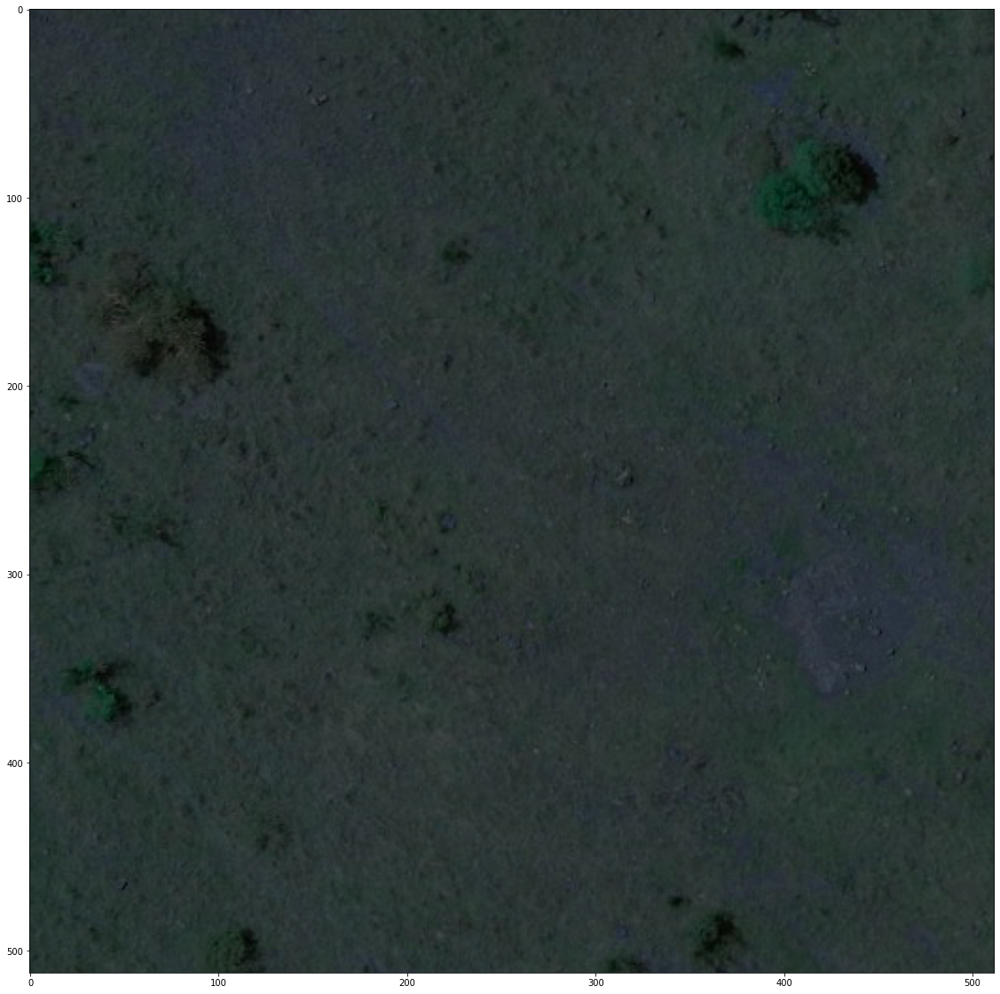

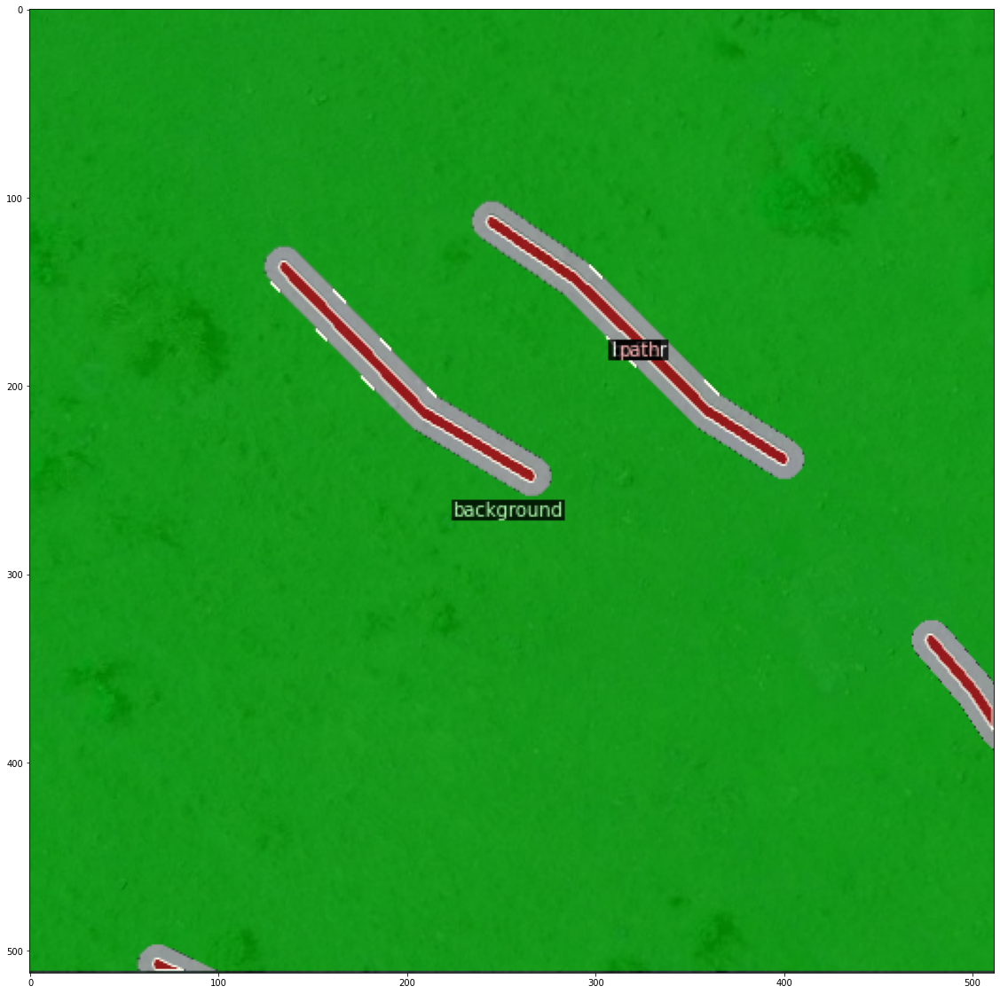

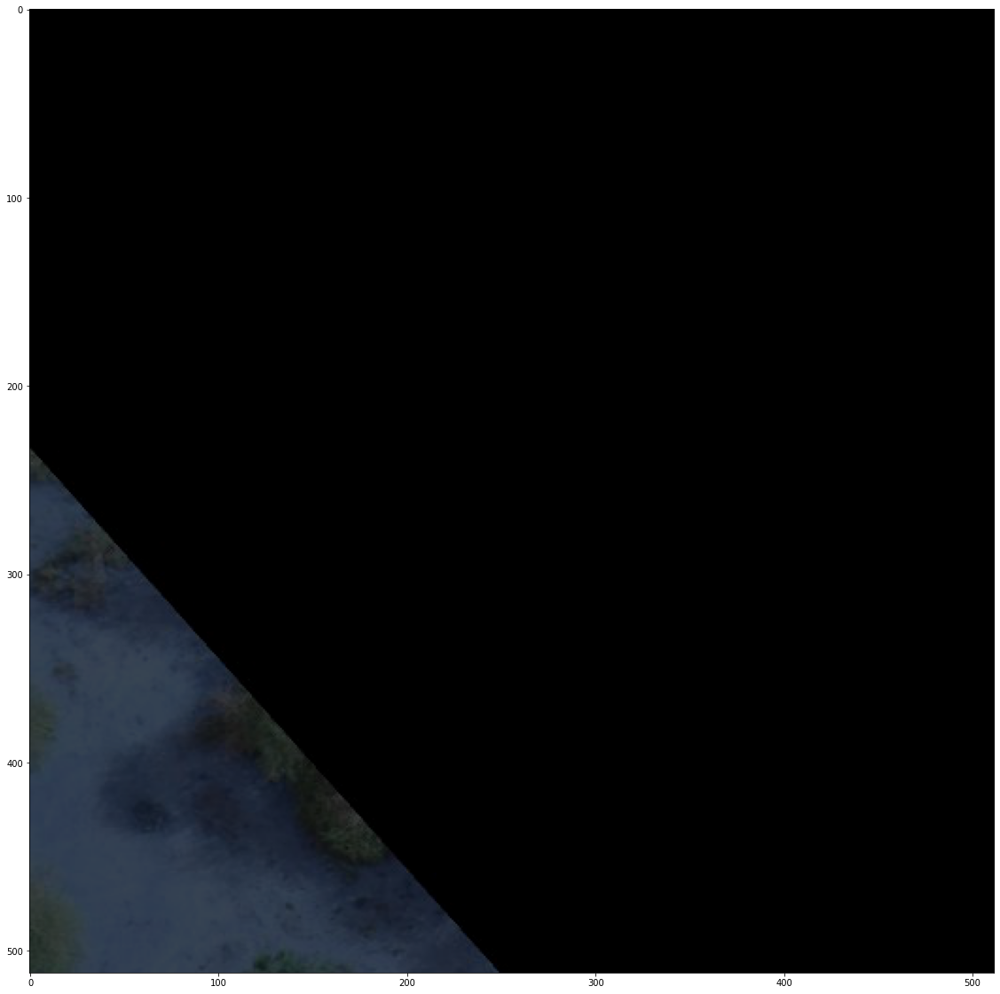

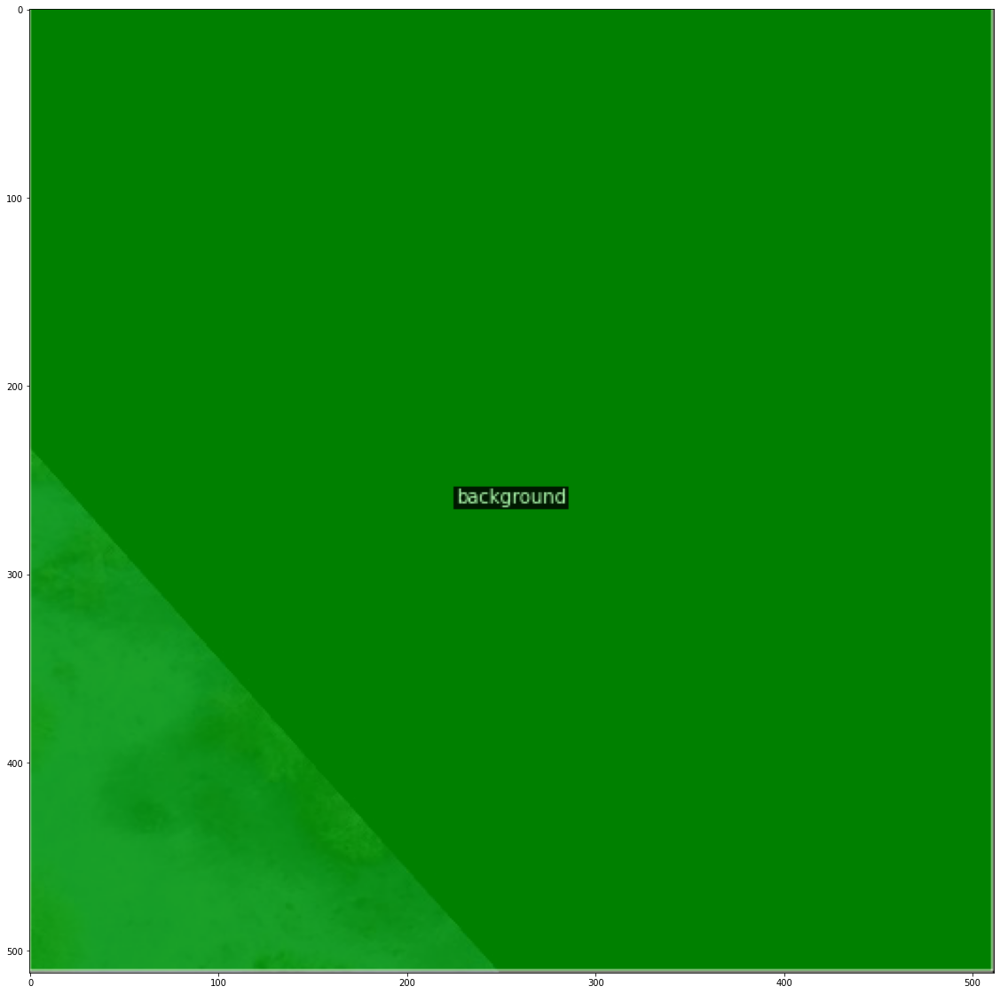

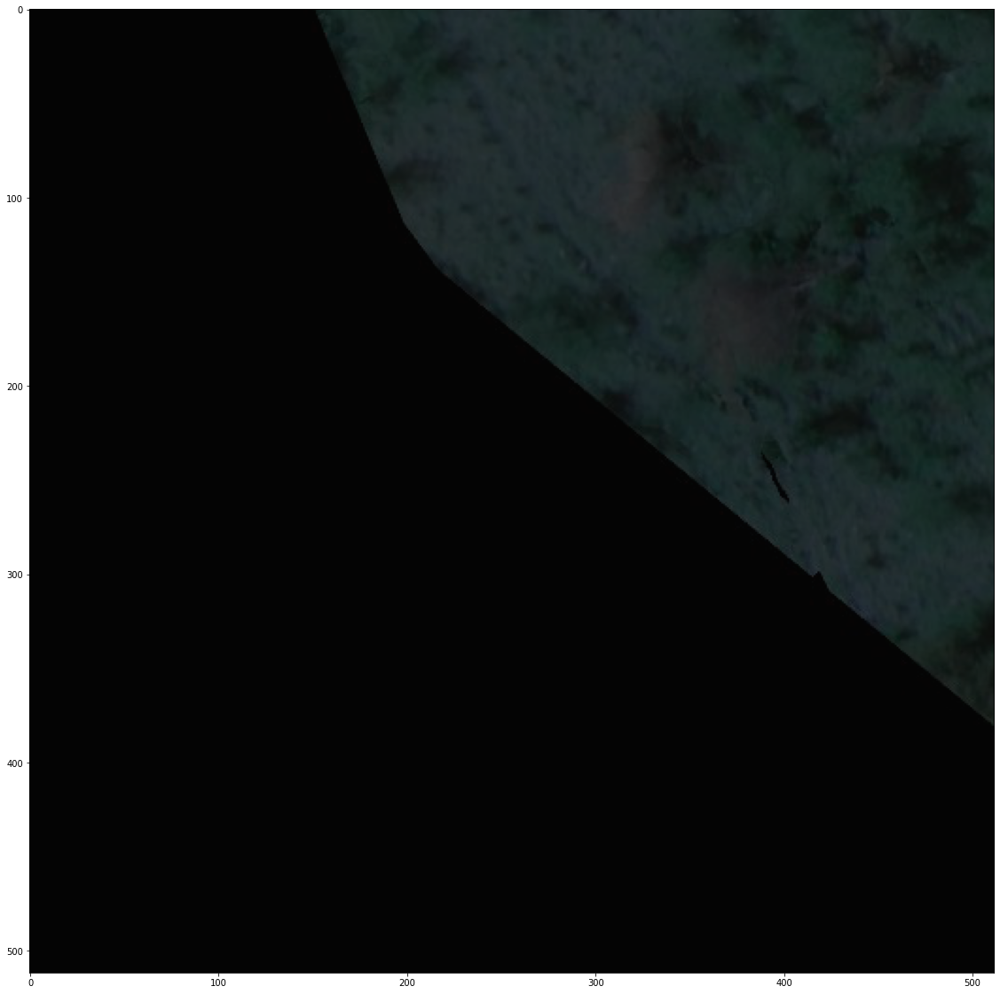

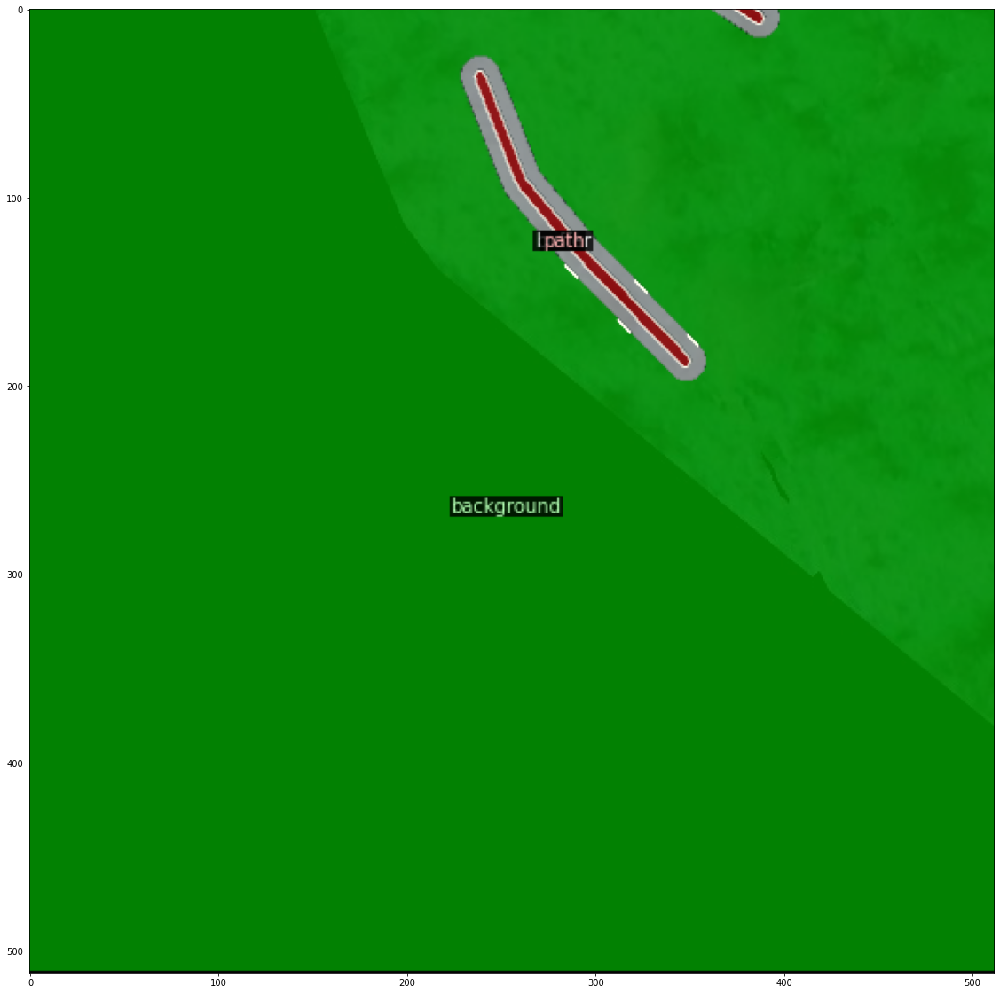

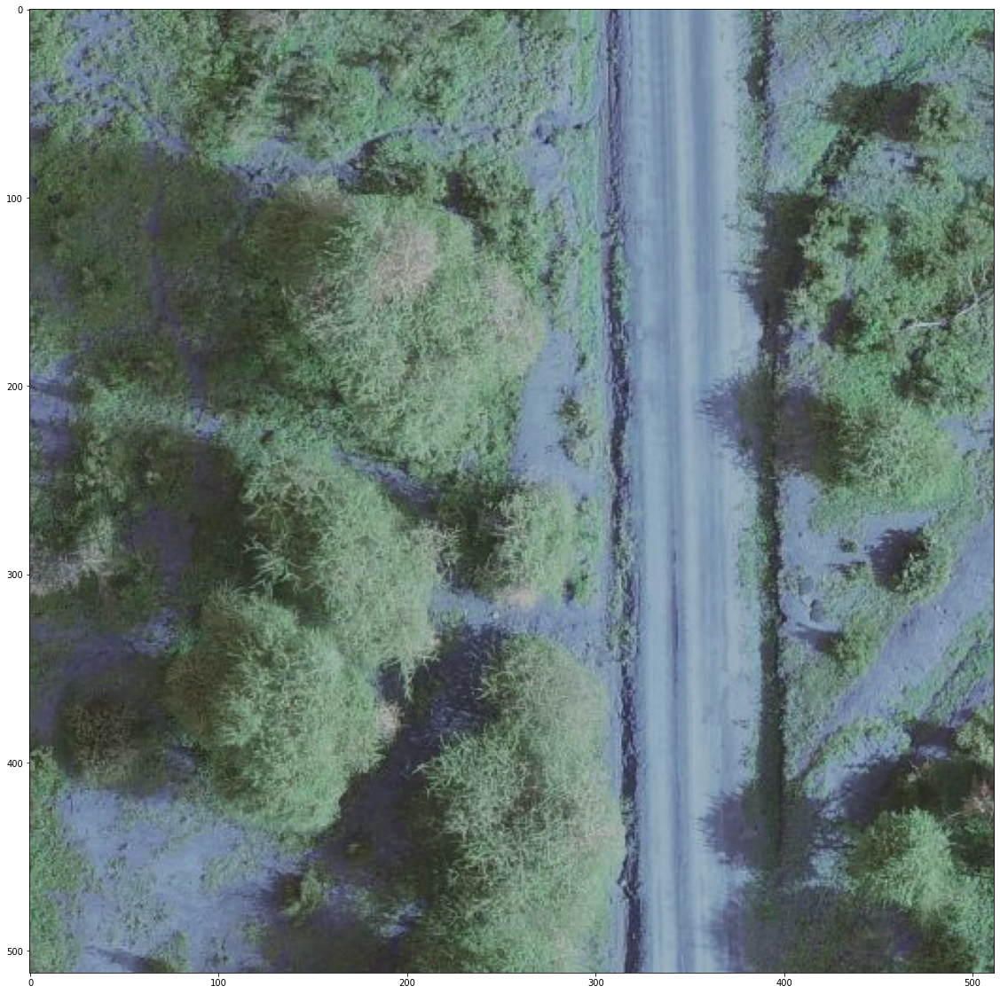

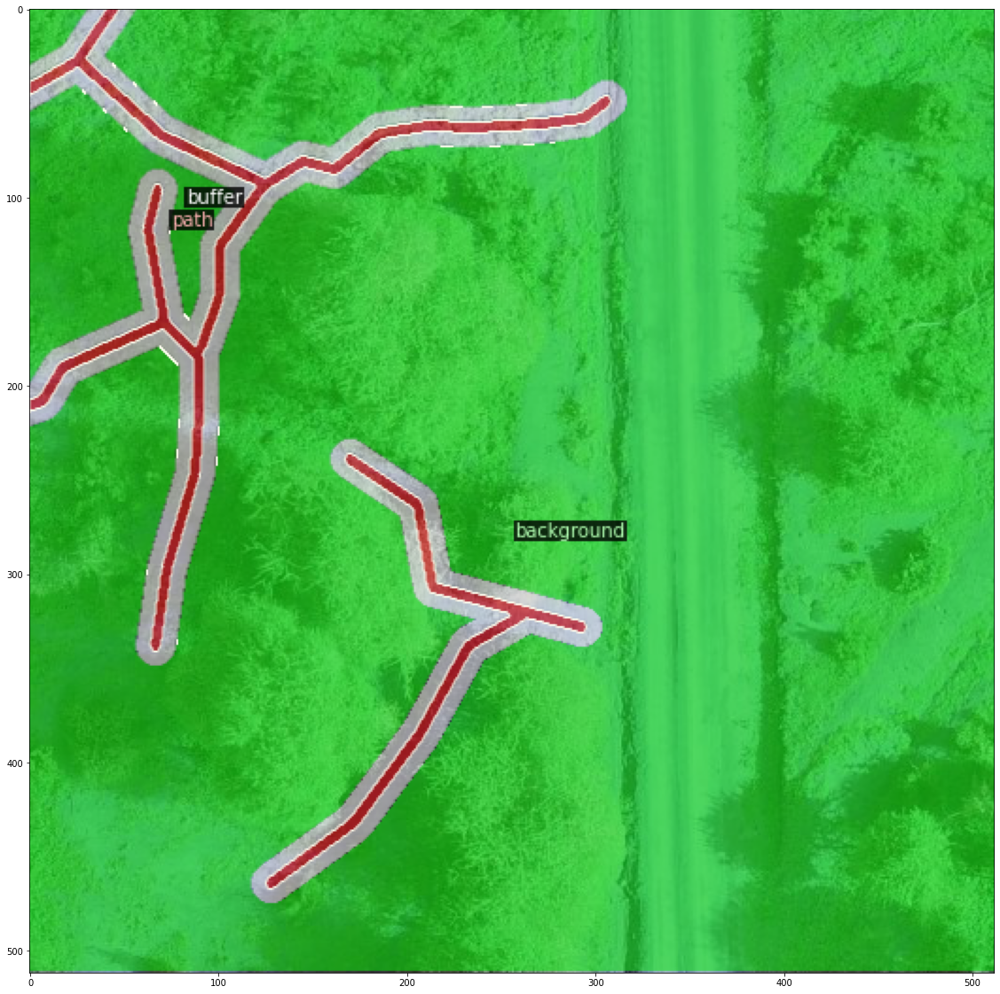

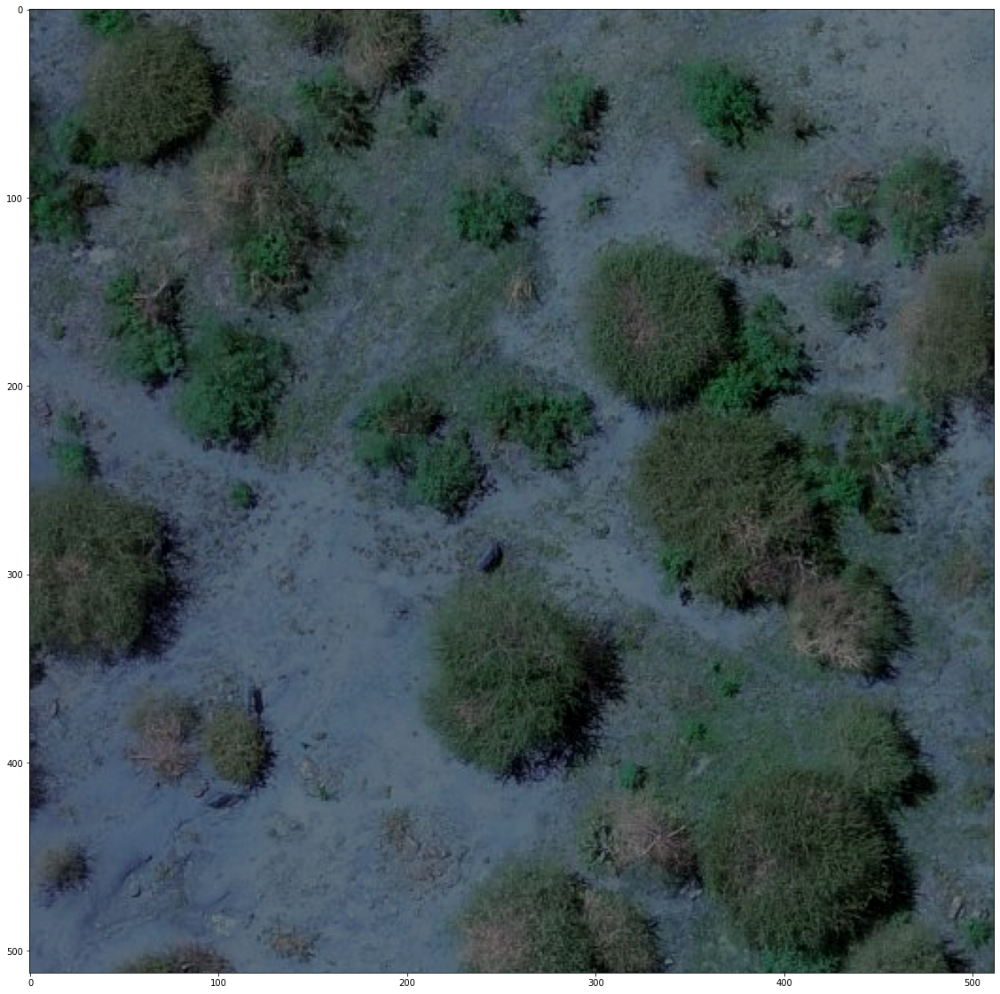

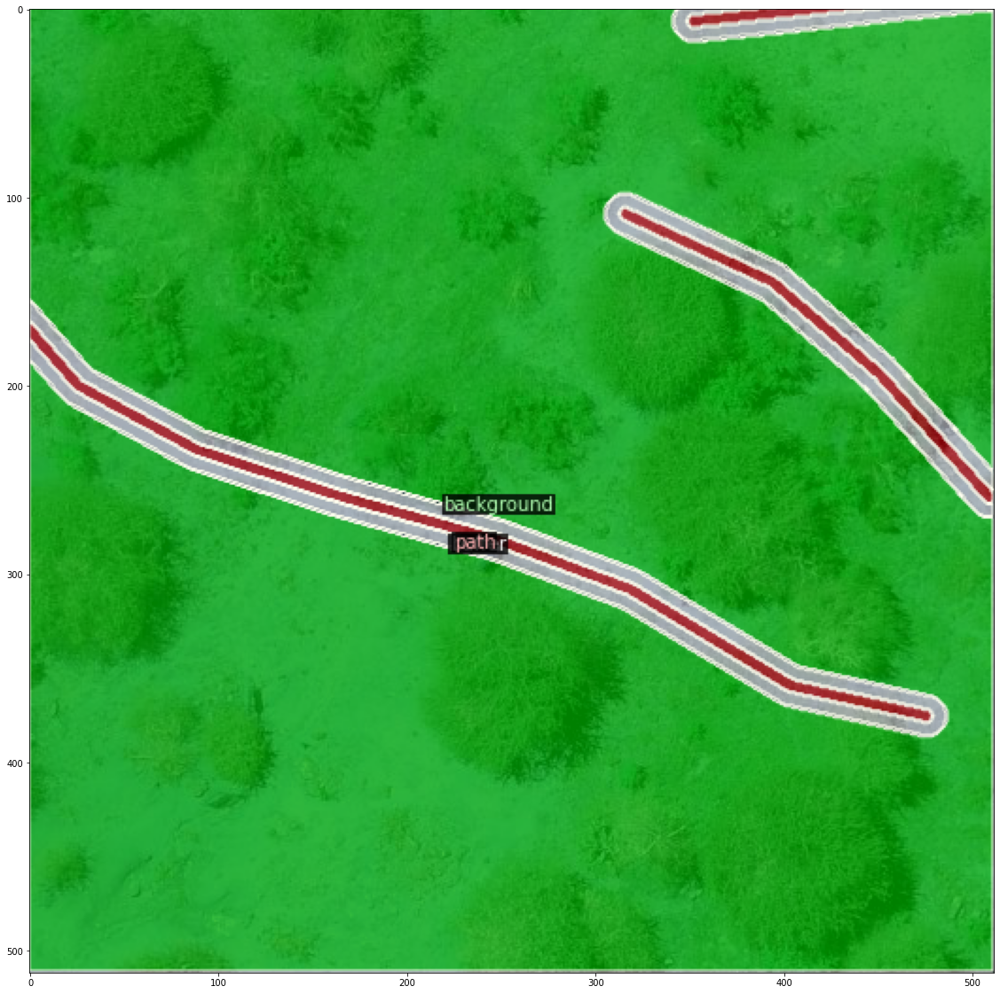

In [31]:
import matplotlib.pyplot as plt

for im_dict in batch[:5]:
    image = im_dict['image'].numpy()
    image = np.transpose(image, [1, 2, 0]).astype(np.uint8)
    visualizer = Visualizer(image[:, :, ::-1], metadata=train_metadata, scale=1.0)
    plt.figure(figsize=(20,20))
    plt.imshow(visualizer.output.get_image())
    sem_seg = im_dict['sem_seg']
    vis = visualizer.draw_sem_seg(sem_seg, alpha=0.5)
    plt.figure(figsize=(20,20))
    plt.imshow(vis.get_image())
    print(im_dict['file_name'])

In [32]:
def main(cfg):
    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
    trainer = Trainer(cfg)
    trainer.resume_or_load(resume=False)
    dist.init_process_group(
            backend="NCCL", init_method="file:///distributed_test", world_size=1, rank=0
        )
    trainer.train()

In [12]:
main(cfg)